# London Real Estate Pricing Analysis

## Introduction
In this project I have scraped data from various data about London real estate price and its Boroughs.Then I used Foursquare API to get the common venues of the boroughs.Then using K-means clustering I clustered London Neighborhoods on the basis of the common venues.

# Importing Libraries

In [6]:
!pip install geocoder
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import geocoder as geocoder
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

     |████████████████████████████████| 102kB 218kB/s ta 0:00:01
You should consider upgrading via the 'pip install --upgrade pip' command.
Libraries imported.


# Scraping table from Wikipedia

In [8]:
!pip install wikipedia
import pandas as pd
import wikipedia as wp
 
#Get the html source
html = wp.page("List of areas of London").html().encode("UTF-8")
df = pd.read_html(html)[1]
df.head()

  Created wheel for wikipedia: filename=wikipedia-1.4.0-cp37-none-any.whl size=11685 sha256=e0c67bb24102f4b645ed049de6a5061c0d8be066f079df6d7cfeea0503ea56c8
  Stored in directory: /Users/tarun.rao/Library/Caches/pip/wheels/87/2a/18/4e471fd96d12114d16fe4a446d00c3b38fb9efcb744bd31f4a
Successfully built wikipedia
You should consider upgrading via the 'pip install --upgrade pip' command.


,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [9]:
df.columns

Index(['Location', 'London borough', 'Post town', 'Postcode district',
       'Dial code', 'OS grid ref'],
      dtype='object')

In [10]:
df.columns = ['Location','London_borough','Post town','Postcode district','Dial Code','OS grid ref']

## Cleaning the table

The table contains hyperlinks numbers and there are more than one Postal codes so I decided to keep one.

In [11]:
df['London_borough'] =  df['London_borough'].apply(lambda x: x.replace('[','').replace(']','')) 
df['London_borough'] =  df['London_borough'].str.replace('\d+', '')
df['London_borough'] =  df['London_borough'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split('(').str[0]
df['Post town'] =  df['Post town'].str.split(',').str[0]

In [12]:
df.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785
1,Acton,Ealing,LONDON,W3,020,TQ205805
2,Addington,Croydon,CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728


In [13]:
df.to_csv('london.csv',index=False)

In [14]:
df.shape

(533, 6)

# Getting property data of London
 
This time it was not a wikipedia page so I use pandas read_html function to scrape data.

In [15]:
tables = pd.read_html("https://propertydata.co.uk/cities/london",header=0)
df2=pd.DataFrame(data=tables[0])
df2

,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
0,BR1,3.4%,"£435,299",£460,+24%,Explore data
1,BR2,3.7%,"£480,982",£467,+23%,Explore data
2,BR3,3.6%,"£456,031",£483,+23%,Explore data
3,BR4,-,"£594,100",£457,+23%,Explore data
4,BR5,3.3%,"£438,232",£418,+25%,Explore data
5,BR6,3.0%,"£547,191",£461,+23%,Explore data
6,BR7,3.2%,"£551,789",£496,+23%,Explore data
7,BR8,-,"£367,316",£356,+26%,Explore data
8,CR0,4.0%,"£350,350",£431,+26%,Explore data
9,CR2,3.7%,"£394,200",£436,+25%,Explore data


In [16]:
df2.columns

Index(['Area', 'Avg yield', 'Avg price', '£/sqft', '5yr +/-', 'Explore data'], dtype='object')

# Cleaning Property Data

Firstly removed unwanted columns then price was in string format so '£' and commas to be removed

In [17]:
df2.drop(columns=['Avg yield','£/sqft','5yr +/-','Explore data'],inplace=True)

In [18]:
df2.head()

,Area,Avg price
0,BR1,"£435,299"
1,BR2,"£480,982"
2,BR3,"£456,031"
3,BR4,"£594,100"
4,BR5,"£438,232"


In [19]:
df2['Avg price'] = df2['Avg price'].str.replace("£","")
df2['Avg price'] = df2['Avg price'].str.replace(',', '')
df2['Avg price'] = pd.to_numeric(df2['Avg price'])

In [20]:
df2.head()

,Area,Avg price
0,BR1,435299
1,BR2,480982
2,BR3,456031
3,BR4,594100
4,BR5,438232


In [21]:
df2.columns=['Postcode district','Avg price']

In [22]:
df2.to_csv('london_postcode.csv',index=False)

# Merge the table of London Boroughs and London House Prices

I have done inner joint because there were many postcodes that were not in the London Borough's table

In [23]:
data=pd.merge(df, df2, how='inner', left_on='Postcode district', right_on='Postcode district')

# Finding Longitude and Latitude of the Locations


In [24]:
def getLatLong(row):
    #print('post :{}'.format(row[:]))
    #print('neigh :{}'.format(row[1]))
    # initialize your variable to None
    lat_lng_coords = None
    search_query = '{}, London,UK'.format(row)
    # loop until you get the coordinates
    try:
        while(lat_lng_coords is None):
            #g = geocoder.here(search_query,app_id=app_id,app_code=app_code)
            g = geocoder.arcgis(search_query)
            lat_lng_coords = g.latlng
            #print('FIRST')
    except IndexError:
        latitude = 0.0
        longitude = 0.0
        print('BACKUP')
        return [latitude,longitude]

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    print(latitude, longitude)
    return [latitude, longitude]

In [25]:
coords_list = data['Postcode district'].apply(getLatLong).tolist()

51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.51324000000005 -0.2674599999999714
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.51200000000006 -0.08057999999994081
51.51200000000006 -0.08057999999994081
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.51651000000004 -0.11967999999995982
51.50642000000005 -0.12

## Merging the values in the dataframe

In [26]:
data[['Latitude','Longitude']]=pd.DataFrame(coords_list,columns=['Latitude', 'Longitude'])
data.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,344217,51.492450,0.121270
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,344217,51.492450,0.121270
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,344217,51.492450,0.121270
3,Acton,Ealing,LONDON,W3,020,TQ205805,552552,51.513240,-0.267460
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,350350,51.384755,-0.051499


## Droping unwanted columns

In [27]:
data.drop(columns=['Post town','Dial Code','OS grid ref'],inplace=True)

#### Use geopy library to get the latitude and longitude values of London.

In [28]:
address = 'London'

geolocator = Nominatim(user_agent="ldn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


## Create a map of London with neighborhoods superimposed on top.

In [29]:
map_london = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(data['Latitude'], data['Longitude'], data['London_borough'], data['Location']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)  
    
map_london

Next, utilizing the Foursquare API to explore the neighborhoods and segment them.

## Define Foursquare Credentials and Version

In [30]:
CLIENT_ID = 'U0OWUYRP10WK5UFHIVQGDEKRQLZBSFYRALYTWAF0OBVJHIZ4' # your Foursquare ID
CLIENT_SECRET = 'R2BLV2WI204CLFJ5GTAS1OR0U2AFMKZV5UTWI20OREP30SZQ' # your Foursquare Secret
VERSION = '20180604'

In [31]:
def getBuiltUrl(neigh_lat,neigh_long,radius=1400):
    # type your answer here
    LIMIT=100
    #radius=1000
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neigh_lat, 
    neigh_long, 
    radius, 
    LIMIT)
    return url

## Exploring first Location in our dataframe

In [32]:
neigh_name, neigh_borough, neigh_post, neigh_price, neigh_lat, neigh_long = data.iloc[0]
print('Latitude and longitude values of {} are {}, {}.'.format(neigh_name, 
                                                               neigh_lat, 
                                                               neigh_long))
results = requests.get(getBuiltUrl(neigh_lat,neigh_long)).json()
results

Latitude and longitude values of Abbey Wood are 51.492450000000076, 0.12127000000003818.


{'meta': {'code': 200, 'requestId': '5ddcf2fdaba2970028172c76'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Bexley',
  'headerFullLocation': 'Bexley, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 8,
  'suggestedBounds': {'ne': {'lat': 51.50505001260009,
    'lng': 0.14146937077953206},
   'sw': {'lat': 51.479849987400065, 'lng': 0.1010706292205443}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '55bb5956498e05559fb4e8c3',
       'name': "Sainsbury's",
       'location': {'address': 'Harrow Mannor Way',
        'lat': 51.492824108986454,
        'lng': 0.12072390863674594,
        'labeledLatLngs': [{'label': 'display',
          'lat': 51.49282410

In [33]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### Now cleaning the json file and structure it into a *pandas* dataframe.

In [34]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Sainsbury's,Supermarket,51.492824,0.120724
1,Lidl,Supermarket,51.496152,0.118417
2,Lesnes Abbey,Historic Site,51.489526,0.125839
3,Abbey Wood Railway Station (ABW),Train Station,51.490825,0.123432
4,Co-op Food,Grocery Store,51.487650,0.113490


In [35]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

8 venues were returned by Foursquare.


# Function to repeat the same process to all the neighborhoods in London

In [36]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        LIMIT=100
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Running our function for all Location in the dataframe

In [37]:
london_venues = getNearbyVenues(names=data['Location'], 
                                   latitudes=data['Latitude'], 
                                   longitudes=data['Longitude'], 
                                   radius=500)

Abbey Wood
Crossness
West Heath
Acton
Addington
Addiscombe
Coombe
Croydon
Forestdale
New Addington
Shirley
Waddon
Woodside
Albany Park
Bexley (also Old Bexley, Bexley Village)
Dartford
Aldborough Hatch
Gants Hill
Newbury Park
Aldgate
Tower Hill
Aldwych
Charing Cross
Covent Garden
St Giles
Alperton
Sudbury
Wembley
Anerley
Penge
Angel
Barbican
Clerkenwell
Farringdon
Finsbury
St Luke's
Aperfield
Biggin Hill
Archway
Upper Holloway
Ardleigh Green
Emerson Park
Hornchurch
Arkley
Barnet (also Chipping Barnet, High Barnet)
Monken Hadley
Temple Fortune
Arnos Grove
Bounds Green
Brunswick Park
Colney Hatch
Friern Barnet
New Southgate
Balham
Bankside
Bermondsey
Elephant and Castle
Lambeth
Newington
Barking
Creekmouth
Barkingside
Barnehurst
Barnes
Castelnau
Barnes Cray
Crayford
Barnet Gate
The Hale
Mill Hill
Barnsbury
Canonbury
De Beauvoir Town
Hoxton
Islington
Pentonville
Shoreditch
Battersea
Bayswater
Paddington
Beckenham
Bickley
Bromley Common
Eden Park
Elmers End
Beckton
East Ham
Upton Park
Beco

In [38]:
print(london_venues.shape)
london_venues.head()

(21632, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,51.49245,0.12127,Sainsbury's,51.492824,0.120724,Supermarket
1,Abbey Wood,51.49245,0.12127,Lidl,51.496152,0.118417,Supermarket
2,Abbey Wood,51.49245,0.12127,Lesnes Abbey,51.489526,0.125839,Historic Site
3,Abbey Wood,51.49245,0.12127,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station
4,Abbey Wood,51.49245,0.12127,Platform 1,51.491023,0.119491,Platform


### Venues returned for each Neighborhood Location

In [39]:
london_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abbey Wood,7,7,7,7,7,7
Acton,9,9,9,9,9,9
Addington,1,1,1,1,1,1
Addiscombe,1,1,1,1,1,1
Albany Park,100,100,100,100,100,100
Aldborough Hatch,100,100,100,100,100,100
Aldgate,100,100,100,100,100,100
Aldwych,100,100,100,100,100,100
Alperton,100,100,100,100,100,100


In [40]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 318 uniques categories.


## Analyzing each Neighborhood Location

In [41]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Outdoor Supply Store,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roof Deck,Sake Bar,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri L

In [42]:
london_onehot.shape

(21632, 319)

###  Grouping rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [43]:
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Outdoor Supply Store,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roof Deck,Sake Bar,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri L

In [44]:
a=london_grouped
a.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Outdoor Supply Store,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Photography Studio,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Pub,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Resort,Restaurant,River,Road,Rock Club,Roof Deck,Sake Bar,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sri L

### Top 5 most common venues for each Neighborhood

In [45]:
num_top_venues = 5

for hood in a['Neighborhood']:
    print("----"+hood+"----")
    temp = a[a['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Wood----
               venue  freq
0        Supermarket  0.29
1      Historic Site  0.14
2        Coffee Shop  0.14
3      Train Station  0.14
4  Convenience Store  0.14


----Acton----
                venue  freq
0  Miscellaneous Shop  0.11
1   Indian Restaurant  0.11
2         Gas Station  0.11
3     Bed & Breakfast  0.11
4       Grocery Store  0.11


----Addington----
                 venue  freq
0        Grocery Store   1.0
1    Accessories Store   0.0
2               Palace   0.0
3            Pet Store   0.0
4  Peruvian Restaurant   0.0


----Addiscombe----
                 venue  freq
0        Grocery Store   1.0
1    Accessories Store   0.0
2               Palace   0.0
3            Pet Store   0.0
4  Peruvian Restaurant   0.0


----Albany Park----
                venue  freq
0               Hotel  0.07
1             Theater  0.06
2              Garden  0.04
3               Plaza  0.04
4  Mexican Restaurant  0.03


----Aldborough Hatch----
                venue  freq
0

## Put in the Dataframe

In [46]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Create the new dataframe and display the top 10 venues for each neighborhood.

In [47]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = a['Neighborhood']

for ind in np.arange(a.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(a.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Supermarket,Convenience Store,Historic Site,Train Station,Platform,Coffee Shop,French Restaurant,Food Court,Flea Market,Furniture / Home Store
1,Acton,Gas Station,Indian Restaurant,Train Station,Miscellaneous Shop,Park,Grocery Store,Convenience Store,Bed & Breakfast,Breakfast Spot,French Restaurant
2,Addington,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest
3,Addiscombe,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest
4,Albany Park,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar


In [48]:
neighborhoods_venues_sorted.rename(columns = {'Neighborhood':'Location'}, inplace = True)

## Adding Average house price of each Neighborhood in the Group
### Normalizing the Avg price column

In [49]:
a['Price']=data['Avg price']
v= a.iloc[:, -1]
a.iloc[:,-1] = (v - v.min()) / (v.max() - v.min())




# Clustering Neighborhoods

running K-means clustering for 4 clusters

In [50]:
kclusters = 6

london_grouped_clustering = a.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 1, 1, 3, 3, 3, 3, 3, 0], dtype=int32)

In [51]:
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(london_grouped_clustering)
    kmeanModel.fit(london_grouped_clustering)
    distortions.append(sum(np.min(cdist(london_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / london_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


<Figure size 640x480 with 1 Axes>

#### Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [53]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

london_merged = data

london_merged = london_merged.join(neighborhoods_venues_sorted.set_index('Location'), on='Location')

london_merged

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Bexley,SE2,344217,51.492450,0.121270,0.0,Supermarket,Convenience Store,Historic Site,Train Station,Platform,Coffee Shop,French Restaurant,Food Court,Flea Market,Furniture / Home Store
1,Crossness,Bexley,SE2,344217,51.492450,0.121270,0.0,Supermarket,Convenience Store,Historic Site,Train Station,Platform,Coffee Shop,French Restaurant,Food Court,Flea Market,Furniture / Home Store
2,West Heath,Bexley,SE2,344217,51.492450,0.121270,0.0,Supermarket,Convenience Store,Historic Site,Train Station,Platform,Coffee Shop,French Restaurant,Food Court,Flea Market,Furniture / Home Store
3,Acton,Ealing,W3,552552,51.513240,-0.267460,0.0,Gas Station,Indian Restaurant,Train Station,Miscellaneous Shop,Park,Grocery Store,Convenience Store,Bed & Breakfast,Breakfast Spot,French Restaurant
4,Addington,Croydon,CR0,350350,51.384755,-0.051499,1.0,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest
5,Addiscombe,Croydon,CR0,350350,51.384755,-0.051499,1.0,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest
6,Coombe,Croydon,CR0,350350,51.384755,-0.051499,4.0,Indian Restaurant,Italian Restaurant,Food,Café,Pub,Pharmacy,Supermarket,Japanese Restaurant,Seafood Restaurant,Dry Cleaner
7,Croydon,Croydon,CR0,350350,51.384755,-0.051499,1.0,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest
8,Forestdale,Croydon,CR0,350350,51.384755,-0.051499,1.0,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest
9,New Addington,Croydon,CR0,350350,51.384755,-0.051499,1.0,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest


##### There was null value in the merged data so droping the rows with null values

In [54]:
london_merged.dropna(inplace=True)

##### Because of null values the data type of 'Cluster Labels' was changed from int to float so converting it back to int

In [55]:
london_merged['Cluster Labels'] = london_merged['Cluster Labels'].astype(int)
london_merged.dtypes

Location                   object
London_borough             object
Postcode district          object
Avg price                   int64
Latitude                  float64
Longitude                 float64
Cluster Labels              int64
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

### There were many Location that were assigned the same postcodes as they were very near so droping the duplicate postcodes 

In [56]:
london_merged.drop_duplicates(subset='Postcode district',inplace=True)

In [57]:
london_merged.reset_index(inplace=True)
london_merged.drop(columns='index',inplace=True)

## Visualize the clusters

In [58]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# Binning

### There is the range of Avg price so binned the price into 7 distinct values
##### ('Low level 1', 'Low level 2', 'Average level 1', 'Average level 2','Above Average','High level 1','High level 2')

Visualizing the bins

Text(0.5, 1.0, 'Price bins')

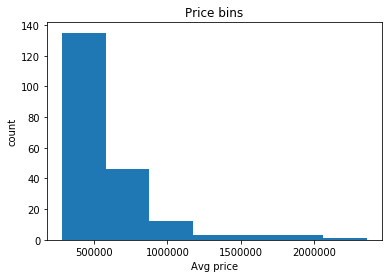

In [59]:
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
plt.pyplot.hist(london_merged["Avg price"],bins=7)

# set x/y labels and plot title
plt.pyplot.xlabel("Avg price")
plt.pyplot.ylabel("count")
plt.pyplot.title("Price bins")

In [60]:
bins = np.linspace(min(london_merged["Avg price"]), max(london_merged["Avg price"]), 8)
bins

array([ 282985.        ,  579733.42857143,  876481.85714286,
       1173230.28571429, 1469978.71428571, 1766727.14285714,
       2063475.57142857, 2360224.        ])

In [61]:
group_names = ['Low level 1', 'Low level 2', 'Average level 1', 'Average level 2','Above Average','High level 1','High level 2']

In [62]:
london_merged['Price-Categories'] = pd.cut(london_merged['Avg price'], bins, labels=group_names, include_lowest=True )
london_merged[['Avg price','Price-Categories']].head()

,Avg price,Price-Categories
0,344217,Low level 1
1,552552,Low level 1
2,350350,Low level 1
3,466579,Low level 1
4,399072,Low level 1


## Cluster bins
### Creating 4 bins for clusters

Text(0.5, 1.0, 'Cluster Labels')

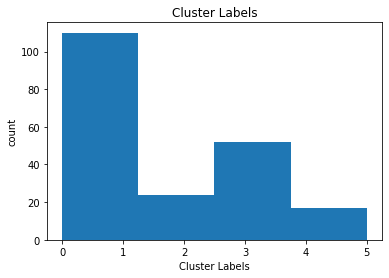

In [63]:
plt.pyplot.hist(london_merged["Cluster Labels"],bins=4)

# set x/y labels and plot title
plt.pyplot.xlabel("Cluster Labels")
plt.pyplot.ylabel("count")
plt.pyplot.title("Cluster Labels")

In [64]:
bins = np.linspace(min(london_merged["Cluster Labels"]), max(london_merged["Cluster Labels"]), 7)
bins

array([0.        , 0.83333333, 1.66666667, 2.5       , 3.33333333,
       4.16666667, 5.        ])

In [65]:
group_names = ['Mixed Social Venues','Hotels and Social Venues','Stores and seafood restaurants','Pubs and Historic places', 'Sports and Athletics','Restaurants and Bars']

In [66]:
london_merged['Cluster-Category'] = pd.cut(london_merged['Cluster Labels'], bins, labels=group_names, include_lowest=True )
london_merged[['Cluster Labels','Cluster-Category']].head()

,Cluster Labels,Cluster-Category
0,0,Mixed Social Venues
1,0,Mixed Social Venues
2,1,Hotels and Social Venues
3,3,Pubs and Historic places
4,3,Pubs and Historic places


# Examining the Clusters

## Cluster 1

In [70]:
london_merged[london_merged['Cluster Labels']==0]

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,344217,51.492450,0.121270,0,Supermarket,Convenience Store,Historic Site,Train Station,Platform,Coffee Shop,French Restaurant,Food Court,Flea Market,Furniture / Home Store,Low level 1,Mixed Social Venues
1,Acton,Ealing,W3,552552,51.513240,-0.267460,0,Gas Station,Indian Restaurant,Train Station,Miscellaneous Shop,Park,Grocery Store,Convenience Store,Bed & Breakfast,Breakfast Spot,French Restaurant,Low level 1,Mixed Social Venues
8,Anerley,Bromley,SE20,372027,51.410090,-0.056830,0,Supermarket,Grocery Store,Fast Food Restaurant,Hotel,Convenience Store,Zoo Exhibit,Food,Food & Drink Shop,Food Court,Food Service,Low level 1,Mixed Social Venues
9,Angel,Islington,EC1,877839,51.523610,-0.098770,0,Coffee Shop,Food Truck,Pub,Hotel,Italian Restaurant,Café,Vietnamese Restaurant,Gym / Fitness Center,Park,Sandwich Place,Average level 1,Mixed Social Venues
10,Aperfield,Bromley,TN16,450589,51.271728,0.074711,0,Gas Station,Soccer Field,Historic Site,Discount Store,Flea Market,Food,Food & Drink Shop,Food Court,Food Service,Diner,Low level 1,Mixed Social Venues
11,Archway,Islington,N19,600495,51.563930,-0.129450,0,Coffee Shop,Grocery Store,Pub,Italian Restaurant,Pizza Place,Hotel,Supermarket,Sandwich Place,Thai Restaurant,Fast Food Restaurant,Low level 2,Mixed Social Venues
12,Ardleigh Green,Havering,RM11,509803,51.583700,0.174760,0,Bus Station,Music Store,Café,Furniture / Home Store,Supermarket,French Restaurant,Food Court,Food Service,Food Stand,Food Truck,Low level 1,Mixed Social Venues
14,Arnos Grove,Enfield,N11,528377,51.616310,-0.138390,0,Bus Stop,Grocery Store,Fish & Chips Shop,Train Station,Gym,Convenience Store,Beer Bar,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Low level 1,Mixed Social Venues
15,Balham,Wandsworth,SW12,648056,51.448220,-0.148390,0,Coffee Shop,Grocery Store,Pub,Indian Restaurant,Bakery,Breakfast Spot,Italian Restaurant,Supermarket,Gym,Cocktail Bar,Low level 2,Mixed Social Venues
22,Barnet Gate,Barnet,NW7,713524,51.615680,-0.245110,0,Grocery Store,Bus Stop,Juice Bar,Train Station,Indian Restaurant,Ice Cream Shop,Gym / Fitness Center,Pharmacy,Pizza Place,Platform,Low level 2,Mixed Social Venues


## Cluster 2

In [71]:
london_merged[london_merged['Cluster Labels']==1]

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
2,Addington,Croydon,CR0,350350,51.384755,-0.051499,1,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Low level 1,Hotels and Social Venues
179,Rush Green,Barking and Dagenham,RM7,338878,51.574088,0.167940,1,Grocery Store,Racetrack,Zoo Exhibit,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Low level 1,Hotels and Social Venues


## Cluster 3

In [72]:
london_merged[london_merged['Cluster Labels']==2]

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
13,Arkley,Barnet,EN5,636656,51.644415,-0.179185,2,Coffee Shop,Pub,Recruiting Agency,Tennis Court,Food Truck,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Low level 2,Stores and seafood restaurants
16,Bankside,Southwark,SE1,951911,51.499600,-0.096130,2,Pub,Coffee Shop,Sandwich Place,Park,Garden,Theater,Argentinian Restaurant,Indian Restaurant,Gym / Fitness Center,Café,Average level 1,Stores and seafood restaurants
41,Blackheath,Lewisham,SE3,519332,51.471380,0.023380,2,Photography Studio,Pub,Zoo Exhibit,Forest,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Low level 1,Stores and seafood restaurants
44,Botany Bay,Enfield,EN2,559965,51.653660,-0.110614,2,Pub,Lake,Zoo Exhibit,Forest,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Low level 1,Stores and seafood restaurants
45,Bow,Tower Hamlets,E3,433365,51.527020,-0.025940,2,Pub,Bus Stop,Grocery Store,Bar,Park,Locksmith,Light Rail Station,Burger Joint,Forest,Food Court,Low level 1,Stores and seafood restaurants
46,Bowes Park,Haringey,N22,495009,51.602140,-0.112230,2,Italian Restaurant,Pub,Bar,Indian Restaurant,Park,Gym,Zoo Exhibit,Food Truck,Food,Food & Drink Shop,Low level 1,Stores and seafood restaurants
47,Brentford,Hounslow,TW8,483980,51.487701,-0.297793,2,Pub,Hotel,Fast Food Restaurant,Cocktail Bar,Historic Site,Bar,History Museum,Indie Movie Theater,Indian Restaurant,Soccer Stadium,Low level 1,Stores and seafood restaurants
50,Brimsdown,Enfield,EN3,358623,51.643220,-0.043790,2,Café,Pub,Food & Drink Shop,Fast Food Restaurant,Supermarket,Turkish Restaurant,Zoo Exhibit,Food Truck,Food,Food Court,Low level 1,Stores and seafood restaurants
53,Plaistow,Bromley,BR1,435299,51.416710,0.009042,2,Café,Bus Station,Pub,Park,Gym,Forest,Food & Drink Shop,Food Court,Food Service,Food Stand,Low level 1,Stores and seafood restaurants
70,Chislehurst,Bromley,BR7,551789,51.413275,0.087473,2,Nature Preserve,Pub,Gym Pool,Forest,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Low level 1,Stores and seafood restaurants


## Cluster 4

In [73]:
london_merged[london_merged['Cluster Labels']==3]

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
3,Albany Park,Bexley,DA5,466579,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
4,Aldborough Hatch,Redbridge,IG2,399072,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
5,Aldgate,City,EC3,1497571,51.512000,-0.080580,3,Hotel,Gym / Fitness Center,Pub,Restaurant,Coffee Shop,Cocktail Bar,Salad Place,Garden,Hotel Bar,French Restaurant,Above Average,Pubs and Historic places
6,Aldwych,Westminster,WC2,1820426,51.516510,-0.119680,3,Coffee Shop,Theater,Restaurant,Hotel,Korean Restaurant,Pub,Bookstore,Burger Joint,Japanese Restaurant,Opera House,High level 1,Pubs and Historic places
7,Alperton,Brent,HA0,425361,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
23,Barnsbury,Islington,N1,773063,51.537920,-0.099830,3,Pub,Mediterranean Restaurant,French Restaurant,Gastropub,Burger Joint,Bakery,Italian Restaurant,Arts & Crafts Store,Sushi Restaurant,Furniture / Home Store,Low level 2,Pubs and Historic places
25,Bayswater,Westminster,W2,1059343,51.514940,-0.180480,3,Hotel,Café,Pub,Coffee Shop,Italian Restaurant,Garden,Restaurant,Greek Restaurant,Outdoor Sculpture,Fast Food Restaurant,Average level 1,Pubs and Historic places
28,Becontree,Barking and Dagenham,RM9,316921,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
29,Becontree Heath,Barking and Dagenham,RM8,324955,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
34,Belmont,Harrow,HA3,443993,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places


## Cluster 5

In [74]:
london_merged[london_merged['Cluster Labels']==4]

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
17,Barking,Barking and Dagenham,IG11,294231,51.533120,0.084077,4,Grocery Store,Spa,Supermarket,Zoo Exhibit,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Low level 1,Sports and Athletics
18,Barkingside,Redbridge,IG6,460733,51.506420,-0.127210,4,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Sports and Athletics
19,Barnehurst,Bexley,DA7,462564,51.470520,0.146706,4,Pub,Convenience Store,Indian Restaurant,Forest,Zoo Exhibit,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Low level 1,Sports and Athletics
20,Barnes,Richmond upon Thames,SW13,973273,51.474570,-0.242120,4,Pub,Park,Pizza Place,Café,Coffee Shop,Bookstore,Thai Restaurant,Food & Drink Shop,Community Center,Bakery,Average level 1,Sports and Athletics
21,Barnes Cray,Bexley,DA1,282985,51.452068,0.172230,4,Supermarket,Italian Restaurant,Pub,Track Stadium,Mediterranean Restaurant,Food Truck,Flower Shop,Food,Food & Drink Shop,Food Court,Low level 1,Sports and Athletics
75,Colliers Wood,Merton,SW19,617328,51.421700,-0.207960,4,Bar,Pub,Coffee Shop,Clothing Store,Sushi Restaurant,Grocery Store,Sandwich Place,Burger Joint,Supermarket,Italian Restaurant,Low level 2,Sports and Athletics
76,Colyers,Bexley,DA8,311609,51.506420,-0.127210,4,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Sports and Athletics
77,Coney Hall,Bromley,BR4,594100,51.506420,-0.127210,4,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 2,Sports and Athletics
78,Coombe,Kingston upon Thames,KT2,562054,51.410874,-0.291946,4,Indian Restaurant,Italian Restaurant,Food,Café,Pub,Pharmacy,Supermarket,Japanese Restaurant,Seafood Restaurant,Dry Cleaner,Low level 1,Sports and Athletics
79,Coulsdon,Croydon,CR5,539900,51.506420,-0.127210,4,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Sports and Athletics


## Cluster 6

In [75]:
london_merged[london_merged['Cluster Labels']==5]

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
26,Beckenham,Bromley,BR3,456031,51.415095,-0.035403,5,Athletics & Sports,Train Station,Park,Zoo Exhibit,Food Truck,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Low level 1,Restaurants and Bars
96,Eastcote,Hillingdon,HA5,606811,51.612911,-0.376966,5,Trail,Park,Athletics & Sports,Zoo Exhibit,Food Truck,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Low level 2,Restaurants and Bars


# Examining Property prices

In [76]:
london_merged[london_merged['Price-Categories']=='High level 2']

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
67,Chinatown,Westminster,W1,2360224,51.51648,-0.14816,3,Coffee Shop,French Restaurant,Italian Restaurant,Juice Bar,Hotel,Burger Joint,Sandwich Place,Clothing Store,Cosmetics Shop,Café,High level 2,Pubs and Historic places


In [77]:
london_merged[london_merged['Price-Categories']=='High level 1']

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
6,Aldwych,Westminster,WC2,1820426,51.51651,-0.11968,3,Coffee Shop,Theater,Restaurant,Hotel,Korean Restaurant,Pub,Bookstore,Burger Joint,Japanese Restaurant,Opera House,High level 1,Pubs and Historic places
135,Holland Park,Kensington and Chelsea,W8,2023509,51.50162,-0.19173,3,Hotel,Pub,Restaurant,Clothing Store,Café,Spa,Italian Restaurant,Grocery Store,Garden,French Restaurant,High level 1,Pubs and Historic places
143,Kensington,Kensington and Chelsea,SW7,1964654,51.49807,-0.17404,3,Café,Exhibit,Science Museum,Hotel,Garden,Gift Shop,Italian Restaurant,Bar,Bakery,Burger Joint,High level 1,Pubs and Historic places


In [78]:
london_merged[london_merged['Price-Categories']=='Low level 2']

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
11,Archway,Islington,N19,600495,51.563930,-0.129450,0,Coffee Shop,Grocery Store,Pub,Italian Restaurant,Pizza Place,Hotel,Supermarket,Sandwich Place,Thai Restaurant,Fast Food Restaurant,Low level 2,Mixed Social Venues
13,Arkley,Barnet,EN5,636656,51.644415,-0.179185,2,Coffee Shop,Pub,Recruiting Agency,Tennis Court,Food Truck,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Low level 2,Stores and seafood restaurants
15,Balham,Wandsworth,SW12,648056,51.448220,-0.148390,0,Coffee Shop,Grocery Store,Pub,Indian Restaurant,Bakery,Breakfast Spot,Italian Restaurant,Supermarket,Gym,Cocktail Bar,Low level 2,Mixed Social Venues
22,Barnet Gate,Barnet,NW7,713524,51.615680,-0.245110,0,Grocery Store,Bus Stop,Juice Bar,Train Station,Indian Restaurant,Ice Cream Shop,Gym / Fitness Center,Pharmacy,Pizza Place,Platform,Low level 2,Mixed Social Venues
23,Barnsbury,Islington,N1,773063,51.537920,-0.099830,3,Pub,Mediterranean Restaurant,French Restaurant,Gastropub,Burger Joint,Bakery,Italian Restaurant,Arts & Crafts Store,Sushi Restaurant,Furniture / Home Store,Low level 2,Pubs and Historic places
24,Battersea,Wandsworth,SW11,869942,51.467600,-0.162900,0,Café,Pub,Indian Restaurant,Supermarket,Bar,Restaurant,Gym,Gym / Fitness Center,Coffee Shop,Thai Restaurant,Low level 2,Mixed Social Venues
31,Bedford Park,Ealing,W4,672510,51.489440,-0.261940,0,Pub,Italian Restaurant,Café,Bakery,Bookstore,Supermarket,Coffee Shop,Organic Grocery,Bar,Restaurant,Low level 2,Mixed Social Venues
39,Bethnal Green,Tower Hamlets,E2,647460,51.526690,-0.062570,0,Café,Coffee Shop,Pub,Japanese Restaurant,Fast Food Restaurant,Music Store,Brewery,Church,Boxing Gym,Cocktail Bar,Low level 2,Mixed Social Venues
42,Blackwall,Tower Hamlets,E14,583484,51.511220,-0.012640,0,Café,Park,Pool,English Restaurant,Sandwich Place,Chinese Restaurant,Coffee Shop,Light Rail Station,Grocery Store,Zoo Exhibit,Low level 2,Mixed Social Venues
48,Brent Cross,Barnet,NW2,582064,51.562370,-0.221310,0,Clothing Store,Bus Stop,Supermarket,Gym / Fitness Center,Forest,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Low level 2,Mixed Social Venues


In [79]:
london_merged[london_merged['Price-Categories']=='Low level 1']

,Location,London_borough,Postcode district,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,344217,51.492450,0.121270,0,Supermarket,Convenience Store,Historic Site,Train Station,Platform,Coffee Shop,French Restaurant,Food Court,Flea Market,Furniture / Home Store,Low level 1,Mixed Social Venues
1,Acton,Ealing,W3,552552,51.513240,-0.267460,0,Gas Station,Indian Restaurant,Train Station,Miscellaneous Shop,Park,Grocery Store,Convenience Store,Bed & Breakfast,Breakfast Spot,French Restaurant,Low level 1,Mixed Social Venues
2,Addington,Croydon,CR0,350350,51.384755,-0.051499,1,Grocery Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Low level 1,Hotels and Social Venues
3,Albany Park,Bexley,DA5,466579,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
4,Aldborough Hatch,Redbridge,IG2,399072,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
7,Alperton,Brent,HA0,425361,51.506420,-0.127210,3,Hotel,Theater,Garden,Plaza,Sandwich Place,Monument / Landmark,Pub,Art Gallery,Mexican Restaurant,Wine Bar,Low level 1,Pubs and Historic places
8,Anerley,Bromley,SE20,372027,51.410090,-0.056830,0,Supermarket,Grocery Store,Fast Food Restaurant,Hotel,Convenience Store,Zoo Exhibit,Food,Food & Drink Shop,Food Court,Food Service,Low level 1,Mixed Social Venues
10,Aperfield,Bromley,TN16,450589,51.271728,0.074711,0,Gas Station,Soccer Field,Historic Site,Discount Store,Flea Market,Food,Food & Drink Shop,Food Court,Food Service,Diner,Low level 1,Mixed Social Venues
12,Ardleigh Green,Havering,RM11,509803,51.583700,0.174760,0,Bus Station,Music Store,Café,Furniture / Home Store,Supermarket,French Restaurant,Food Court,Food Service,Food Stand,Food Truck,Low level 1,Mixed Social Venues
14,Arnos Grove,Enfield,N11,528377,51.616310,-0.138390,0,Bus Stop,Grocery Store,Fish & Chips Shop,Train Station,Gym,Convenience Store,Beer Bar,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Low level 1,Mixed Social Venues
